In [ ]:
import numpy as np
import pandas as pd
import re
import nltk
nltk.download("stopwords")
import matplotlib.pyplot as plt
%matplotlib inline


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [ ]:
import seaborn as sns
import tensorflow as tf
from nltk.stem import PorterStemmer
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from sklearn.model_selection import train_test_split


In [ ]:
from google.colab import files
uploaded=files.upload()

Saving Tweets.csv to Tweets.csv


In [ ]:
airline_tweets= pd.read_csv("Tweets.csv")

In [ ]:
airline_tweets.head(6)

,tweet_id,airline_sentiment,airline_sentiment_confidence,negativereason,negativereason_confidence,airline,airline_sentiment_gold,name,negativereason_gold,retweet_count,text,tweet_coord,tweet_created,tweet_location,user_timezone
0,570306133677760513,neutral,1.0000,NaN,NaN,Virgin America,NaN,cairdin,NaN,0,@VirginAmerica What @dhepburn said.,NaN,2015-02-24 11:35:52 -0800,NaN,Eastern Time (US & Canada)
1,570301130888122368,positive,0.3486,NaN,0.0000,Virgin America,NaN,jnardino,NaN,0,@VirginAmerica plus you've added commercials t...,NaN,2015-02-24 11:15:59 -0800,NaN,Pacific Time (US & Canada)
2,570301083672813571,neutral,0.6837,NaN,NaN,Virgin America,NaN,yvonnalynn,NaN,0,@VirginAmerica I didn't today... Must mean I n...,NaN,2015-02-24 11:15:48 -0800,Lets Play,Central Time (US & Canada)
3,570301031407624196,negative,1.0000,Bad Flight,0.7033,Virgin America,NaN,jnardino,NaN,0,@VirginAmerica it's really aggressive to blast...,NaN,2015-02-24 11:15:36 -0800,NaN,Pacific Time (US & Canada)
4,570300817074462722,negative,1.0000,Can't Tell,1.0000,Virgin America,NaN,jnardino,NaN,0,@VirginAmerica and it's a really big bad thing...,NaN,2015-02-24 11:14:45 -0800,NaN,Pacific Time (US & Canada)
5,570300767074181121,negative,1.0000,Can't Tell,0.6842,Virgin America,NaN,jnardino,NaN,0,@VirginAmerica seriously would pay $30 a fligh...,NaN,2015-02-24 11:14:33 -0800,NaN,Pacific Time (US & Canada)


In [ ]:
confidence_threshold=0.6
tweets_df=pd.concat([airline_tweets['text'],airline_tweets['airline_sentiment']],axis=1)
tweets_df

,text,airline_sentiment
0,@VirginAmerica What @dhepburn said.,neutral
1,@VirginAmerica plus you've added commercials t...,positive
2,@VirginAmerica I didn't today... Must mean I n...,neutral
3,@VirginAmerica it's really aggressive to blast...,negative
4,@VirginAmerica and it's a really big bad thing...,negative
...,...,...
14635,@AmericanAir thank you we got on a different f...,positive
14636,@AmericanAir leaving over 20 minutes Late Flig...,negative
14637,@AmericanAir Please bring American Airlines to...,neutral
14638,"@AmericanAir you have my money, you change my ...",negative


In [ ]:
tweets_df['airline_sentiment'].value_counts()

negative    9178
neutral     3099
positive    2363
Name: airline_sentiment, dtype: int64

In [ ]:
sentiment_ordering=['negative','neutral','positive']

In [ ]:
tweets_df['airline_sentiment']=tweets_df['airline_sentiment'].apply(lambda x:sentiment_ordering.index(x))
tweets_df

,text,airline_sentiment
0,@VirginAmerica What @dhepburn said.,1
1,@VirginAmerica plus you've added commercials t...,2
2,@VirginAmerica I didn't today... Must mean I n...,1
3,@VirginAmerica it's really aggressive to blast...,0
4,@VirginAmerica and it's a really big bad thing...,0
...,...,...
14635,@AmericanAir thank you we got on a different f...,2
14636,@AmericanAir leaving over 20 minutes Late Flig...,0
14637,@AmericanAir Please bring American Airlines to...,1
14638,"@AmericanAir you have my money, you change my ...",0


In [ ]:
def process_tweet (tweet):
  new_tweet=tweet.lower()
  new_tweet=re.sub(r'@\w+',' ',new_tweet)
  new_tweet=re.sub(r'#',' ',new_tweet)
  new_tweet=re.sub(r'https\S+', ' ',new_tweet) 
  new_tweet=re.sub(r'\$\S+', 'dollar',new_tweet)
  new_tweet=re.sub(r'[^a-z0-9\s', ' ',new_tweet) 
  new_tweet=re.sub(r'[0-9]', 'number', new_tweet)
  new_tweet=new_tweet.split(" ") 
  new_tweet=list(map(lambda x:ps.stem(x), new_tweet)) 
  new_tweet=list(map(lambda x:ps.stem(x), new_tweet)) 
  if '' in new_tweet: 
    new_tweet.remove('')
  return new_tweet

In [ ]:
tweets=tweets_df['text']
labels=np.array(tweets_df['airline_sentiment'])
labels

array([1, 2, 1, ..., 1, 0, 1])

In [ ]:
vocabulary=set()
for tweet in tweets:
  for word in tweet:
    if word not in vocabulary:
      vocabulary.add(word)
vocab_length=len(vocabulary)
max_seq_length=0
for tweet in tweets:
  if len(tweet)>max_seq_length:
    max_seq_length=len(tweet)
print("Vocab Length : ",vocab_length)
print("Max Seq Length : ",max_seq_length)

Vocab Length :  237
Max Seq Length :  186


In [ ]:
tokenizer=Tokenizer(num_words=vocab_length)
tokenizer.fit_on_texts(tweets)
sequences=tokenizer.texts_to_sequences(tweets)
word_index=tokenizer.word_index
model_input=pad_sequences(sequences,max_seq_length,padding='post')

In [ ]:
word_index

{'to': 1,
 'the': 2,
 'i': 3,
 'a': 4,
 'united': 5,
 'you': 6,
 'for': 7,
 'flight': 8,
 'on': 9,
 'and': 10,
 'my': 11,
 'usairways': 12,
 'americanair': 13,
 'is': 14,
 'in': 15,
 'southwestair': 16,
 'jetblue': 17,
 'of': 18,
 'me': 19,
 'it': 20,
 'your': 21,
 'have': 22,
 'was': 23,
 'not': 24,
 'with': 25,
 'no': 26,
 'that': 27,
 'at': 28,
 'this': 29,
 'get': 30,
 'but': 31,
 't': 32,
 'co': 33,
 'be': 34,
 'from': 35,
 'http': 36,
 'can': 37,
 'are': 38,
 'thanks': 39,
 'cancelled': 40,
 'we': 41,
 'now': 42,
 'an': 43,
 'just': 44,
 'service': 45,
 'do': 46,
 'so': 47,
 '2': 48,
 'help': 49,
 'been': 50,
 'time': 51,
 'will': 52,
 'customer': 53,
 'up': 54,
 'out': 55,
 'our': 56,
 'they': 57,
 "i'm": 58,
 'amp': 59,
 'hours': 60,
 'us': 61,
 'what': 62,
 'when': 63,
 'flights': 64,
 'how': 65,
 'hold': 66,
 'plane': 67,
 'if': 68,
 'all': 69,
 'why': 70,
 'thank': 71,
 'still': 72,
 'there': 73,
 'one': 74,
 'please': 75,
 'need': 76,
 'would': 77,
 'delayed': 78,
 "can't":

In [ ]:
model_input.shape

(14640, 186)

In [ ]:
X_train,X_test,y_train,y_test=train_test_split(model_input,labels,train_size=0.7,random_state=22)

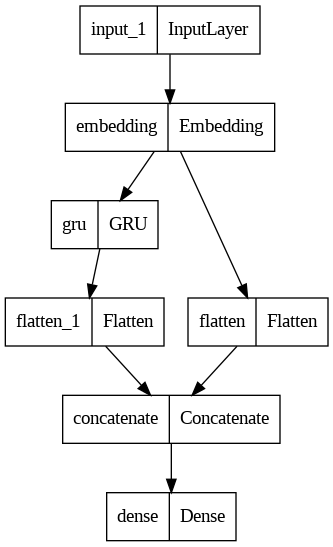

In [ ]:
embedding_dim=32
inputs=tf.keras.Input(shape=(max_seq_length,))
embedding=tf.keras.layers.Embedding(input_dim=vocab_length,output_dim=embedding_dim,input_length=max_seq_length)(inputs)

#Model A
flatten=tf.keras.layers.Flatten()(embedding)

#Model B

gru=tf.keras.layers.GRU(units=embedding_dim)(embedding) #gatted recurrent unit
gru_flatten=tf.keras.layers.Flatten()(gru)

#A and B in output
concat=tf.keras.layers.concatenate([flatten,gru_flatten])
outputs=tf.keras.layers.Dense(3,activation='softmax')(concat)
model=tf.keras.Model(inputs,outputs)
tf.keras.utils.plot_model(model)


In [ ]:
model.compile(
    optimizer='adam',
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

In [ ]:
batch_size=32
epochs=100
history=model.fit(
    X_train,y_train,validation_split=0.2,
    callbacks=[tf.keras.callbacks.EarlyStopping(
        monitor='val_loss',
        patience=3,
        restore_best_weights=True,
        verbose=1
    ),
    tf.keras.callbacks.ReduceLROnPlateau()]
    )

257/257 [==============================] - 23s 82ms/step - loss: 0.7894 - accuracy: 0.6655 - val_loss: 0.6547 - val_accuracy: 0.7337 - lr: 0.0010


<Axes: ylabel='airline'>

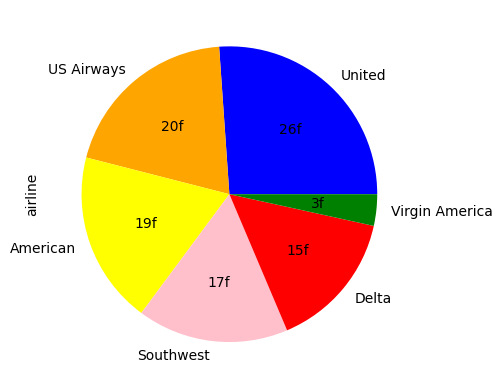

In [ ]:
airline_tweets.airline.value_counts().plot(kind='pie',autopct="%1.0ff",colors=["blue","orange","yellow","pink","red","green"])

<Axes: >

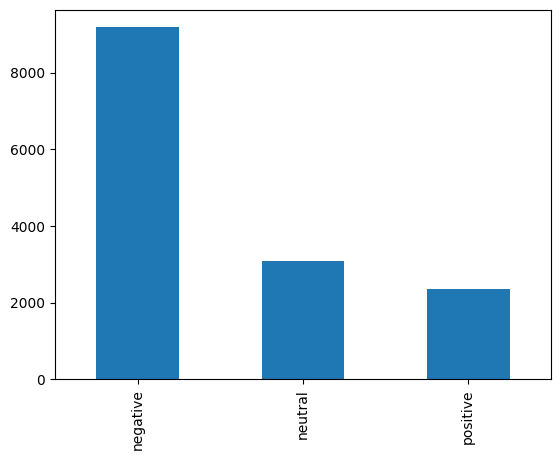

In [ ]:
airline_tweets.airline_sentiment.value_counts().plot(kind='bar')

<Axes: ylabel='airline_sentiment'>

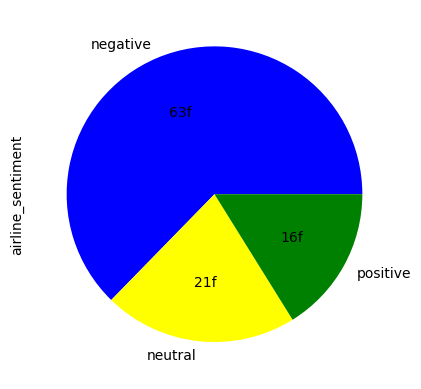

In [ ]:
airline_tweets.airline_sentiment.value_counts().plot(kind='pie',autopct="%1.0ff",colors=["blue","yellow","green"])

<Axes: xlabel='airline'>

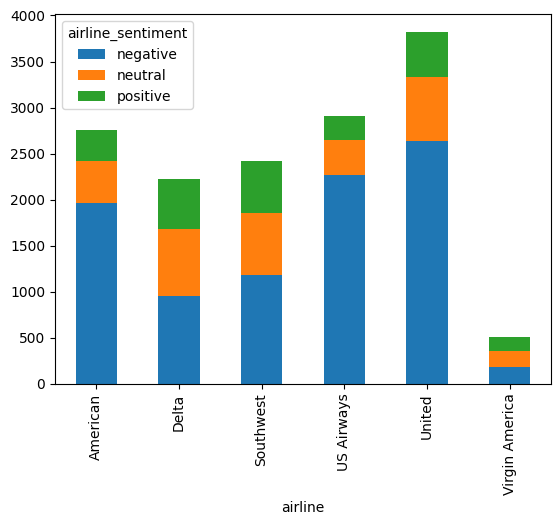

In [ ]:
airline_tweets.groupby(['airline','airline_sentiment']).size().unstack().plot(kind="bar",stacked=True,)

In [ ]:
airline_tweets.head()

,tweet_id,airline_sentiment,airline_sentiment_confidence,negativereason,negativereason_confidence,airline,airline_sentiment_gold,name,negativereason_gold,retweet_count,text,tweet_coord,tweet_created,tweet_location,user_timezone
0,570306133677760513,neutral,1.0000,NaN,NaN,Virgin America,NaN,cairdin,NaN,0,@VirginAmerica What @dhepburn said.,NaN,2015-02-24 11:35:52 -0800,NaN,Eastern Time (US & Canada)
1,570301130888122368,positive,0.3486,NaN,0.0000,Virgin America,NaN,jnardino,NaN,0,@VirginAmerica plus you've added commercials t...,NaN,2015-02-24 11:15:59 -0800,NaN,Pacific Time (US & Canada)
2,570301083672813571,neutral,0.6837,NaN,NaN,Virgin America,NaN,yvonnalynn,NaN,0,@VirginAmerica I didn't today... Must mean I n...,NaN,2015-02-24 11:15:48 -0800,Lets Play,Central Time (US & Canada)
3,570301031407624196,negative,1.0000,Bad Flight,0.7033,Virgin America,NaN,jnardino,NaN,0,@VirginAmerica it's really aggressive to blast...,NaN,2015-02-24 11:15:36 -0800,NaN,Pacific Time (US & Canada)
4,570300817074462722,negative,1.0000,Can't Tell,1.0000,Virgin America,NaN,jnardino,NaN,0,@VirginAmerica and it's a really big bad thing...,NaN,2015-02-24 11:14:45 -0800,NaN,Pacific Time (US & Canada)


In [ ]:
airline_tweets['airline']

0        Virgin America
1        Virgin America
2        Virgin America
3        Virgin America
4        Virgin America
              ...      
14635          American
14636          American
14637          American
14638          American
14639          American
Name: airline, Length: 14640, dtype: object

In [ ]:
airline_American = airline_tweets[airline_tweets['airline'] == 'American']
airline_Delta = airline_tweets[airline_tweets['airline'] == 'Delta']
airline_Virgin = airline_tweets[airline_tweets['airline'] == 'Virgin America']
airline_Southwest = airline_tweets[airline_tweets['airline'] == 'Southwest']
airline_US = airline_tweets[airline_tweets['airline'] == 'US Airways']
airline_United = airline_tweets[airline_tweets['airline'] == 'United']

In [ ]:
negative_count_American = (airline_American['airline_sentiment'] == 'negative').sum()
neutral_count_American = (airline_American['airline_sentiment'] == 'neutral').sum()
positive_count_American = (airline_American['airline_sentiment'] == 'positive').sum()
negative_count_Delta = (airline_Delta['airline_sentiment'] == 'negative').sum()
neutral_count_Delta= (airline_Delta['airline_sentiment'] == 'neutral').sum()
positive_count_Delta = (airline_Delta['airline_sentiment'] == 'positive').sum()
negative_count_Virgin = (airline_Virgin['airline_sentiment'] == 'negative').sum()
neutral_count_Virgin = (airline_Virgin['airline_sentiment'] == 'neutral').sum()
positive_count_Virgin = (airline_Virgin['airline_sentiment'] == 'positive').sum()
negative_count_Southwest = (airline_Southwest['airline_sentiment'] == 'negative').sum()
neutral_count_Southwest = (airline_Southwest['airline_sentiment'] == 'neutral').sum()
positive_count_Southwest = (airline_Southwest['airline_sentiment'] == 'positive').sum()
negative_count_US = (airline_US['airline_sentiment'] == 'negative').sum()
neutral_count_US = (airline_US['airline_sentiment'] == 'neutral').sum()
positive_count_US = (airline_US['airline_sentiment'] == 'positive').sum()
negative_count_United = (airline_United['airline_sentiment'] == 'negative').sum()
neutral_count_United = (airline_United['airline_sentiment'] == 'neutral').sum()
positive_count_United = (airline_United['airline_sentiment'] == 'positive').sum()

In [ ]:
print(f"American Airlines has {negative_count_American} negative tweets, {neutral_count_American} neutral tweets, and {positive_count_American} positive tweets.")
print(f"Delta Airlines has {negative_count_Delta} negative tweets, {neutral_count_Delta} neutral tweets, and {positive_count_Delta} positive tweets.")
print(f"Virgin Airlines has {negative_count_Virgin} negative tweets, {neutral_count_Virgin} neutral tweets, and {positive_count_Virgin} positive tweets.")
print(f"Southwest Airlines has {negative_count_Southwest} negative tweets, {neutral_count_Southwest} neutral tweets, and {positive_count_Southwest} positive tweets.")
print(f"US Airlines has {negative_count_US} negative tweets, {neutral_count_US} neutral tweets, and {positive_count_US} positive tweets.")
print(f"United Airlines has {negative_count_United} negative tweets, {neutral_count_United} neutral tweets, and {positive_count_United} positive tweets.")

American Airlines has 1960 negative tweets, 463 neutral tweets, and 336 positive tweets.
Delta Airlines has 955 negative tweets, 723 neutral tweets, and 544 positive tweets.
Virgin Airlines has 181 negative tweets, 171 neutral tweets, and 152 positive tweets.
Southwest Airlines has 1186 negative tweets, 664 neutral tweets, and 570 positive tweets.
US Airlines has 2263 negative tweets, 381 neutral tweets, and 269 positive tweets.
United Airlines has 2633 negative tweets, 697 neutral tweets, and 492 positive tweets.


In [ ]:
sum_american=negative_count_American + neutral_count_American + positive_count_American
sum_Delta=negative_count_Delta + neutral_count_Delta + positive_count_Delta
sum_Virgin=negative_count_Virgin + neutral_count_Virgin + positive_count_Virgin
sum_Southwest=negative_count_Southwest + neutral_count_Southwest + positive_count_Southwest
sum_US=negative_count_US + neutral_count_US + positive_count_US
sum_United=negative_count_United + neutral_count_United + positive_count_United

neg_avg_american=(negative_count_American/sum_american)*100
neu_avg_american=(neutral_count_American/sum_american)*100
pos_avg_american=(positive_count_American/sum_american)*100
neg_avg_Delta=(negative_count_Delta/sum_Delta)*100
neu_avg_Delta=(neutral_count_Delta/sum_Delta)*100
pos_avg_Delta=(positive_count_Delta/sum_Delta)*100
neg_avg_Virgin=(negative_count_Virgin/sum_Virgin)*100
neu_avg_Virgin=(neutral_count_Virgin/sum_Virgin)*100
pos_avg_Virgin=(positive_count_Virgin/sum_Virgin)*100
neg_avg_Southwest=(negative_count_Southwest/sum_Southwest)*100
neu_avg_Southwest=(neutral_count_Southwest/sum_Southwest)*100
pos_avg_Southwest=(positive_count_Southwest/sum_Southwest)*100
neg_avg_US=(negative_count_US/sum_US)*100
neu_avg_US=(neutral_count_US/sum_US)*100
pos_avg_US=(positive_count_US/sum_US)*100
neg_avg_United=(negative_count_United/sum_United)*100
neu_avg_United=(neutral_count_United/sum_United)*100
pos_avg_United=(positive_count_United/sum_United)*100


print(f"Negative percentage in Delta airlines is: {round(neg_avg_Delta,2)}%")
print(f"Neutral percentage in Delta airlines is: {round(neu_avg_Delta,2)}%")
print(f"Positive percentage in Delta airlines is: {round(pos_avg_Delta,2)}%")
print(f"============================================================================")
print(f"Negative percentage in American airlines is: {round(neg_avg_american,2)}%")
print(f"Neutral percentage in American airlines is: {round(neu_avg_american,2)}%")
print(f"Positive percentage in American airlines is: {round(pos_avg_american,2)}%")
print(f"============================================================================")
print(f"Negative percentage in Virgin airlines is: {round(neg_avg_Virgin,2)}%")
print(f"Neutral percentage in Virgin airlines is: {round(neu_avg_Virgin,2)}%")
print(f"Positive percentage in Virgin airlines is: {round(pos_avg_Virgin,2)}%")
print(f"============================================================================")
print(f"Negative percentage in Southwest airlines is: {round(neg_avg_Southwest,2)}%")
print(f"Neutral percentage in Southwest airlines is: {round(neu_avg_Southwest,2)}%")
print(f"Positive percentage in Southwest airlines is: {round(pos_avg_Southwest,2)}%")
print(f"============================================================================")
print(f"Negative percentage in US airlines is: {round(neg_avg_US,2)}%")
print(f"Neutral percentage in US airlines is: {round(neu_avg_US,2)}%")
print(f"Positive percentage in US airlines is: {round(pos_avg_US,2)}%")
print(f"============================================================================")
print(f"Negative percentage in United airlines is: {round(neg_avg_United,2)}%")
print(f"Neutral percentage in United airlines is: {round(neu_avg_United,2)}%")
print(f"Positive percentage in United airlines is: {round(pos_avg_United,2)}%")


Negative percentage in Delta airlines is: 42.98%
Neutral percentage in Delta airlines is: 32.54%
Positive percentage in Delta airlines is: 24.48%
Negative percentage in American airlines is: 71.04%
Neutral percentage in American airlines is: 16.78%
Positive percentage in American airlines is: 12.18%
Negative percentage in Virgin airlines is: 35.91%
Neutral percentage in Virgin airlines is: 33.93%
Positive percentage in Virgin airlines is: 30.16%
Negative percentage in Southwest airlines is: 49.01%
Neutral percentage in Southwest airlines is: 27.44%
Positive percentage in Southwest airlines is: 23.55%
Negative percentage in US airlines is: 77.69%
Neutral percentage in US airlines is: 13.08%
Positive percentage in US airlines is: 9.23%
Negative percentage in United airlines is: 68.89%
Neutral percentage in United airlines is: 18.24%
Positive percentage in United airlines is: 12.87%


In [ ]:
from google.colab import files
uploaded=files.upload()

Saving information on all airports.csv to information on all airports.csv


In [ ]:
from google.colab import files
uploaded=files.upload()

Saving airport_volume_airport_locations.csv to airport_volume_airport_locations.csv


In [ ]:
import pandas as pd1
airports= pd1.read_csv("information on all airports.csv")

In [ ]:
import pandas as pd2
airports_new= pd2.read_csv("airport_volume_airport_locations.csv")

In [ ]:
airports.head()

,id,ident,type,name,latitude_deg,longitude_deg,elevation_ft,continent,iso_country,iso_region,municipality,scheduled_service,gps_code,iata_code,local_code,home_link,wikipedia_link,keywords
0,6523,00A,heliport,Total Rf Heliport,40.070801,-74.933601,11.0,NaN,US,US-PA,Bensalem,no,00A,NaN,00A,NaN,NaN,NaN
1,323361,00AA,small_airport,Aero B Ranch Airport,38.704022,-101.473911,3435.0,NaN,US,US-KS,Leoti,no,00AA,NaN,00AA,NaN,NaN,NaN
2,6524,00AK,small_airport,Lowell Field,59.947733,-151.692524,450.0,NaN,US,US-AK,Anchor Point,no,00AK,NaN,00AK,NaN,NaN,NaN
3,6525,00AL,small_airport,Epps Airpark,34.864799,-86.770302,820.0,NaN,US,US-AL,Harvest,no,00AL,NaN,00AL,NaN,NaN,NaN
4,506791,00AN,small_airport,Katmai Lodge Airport,59.093287,-156.456699,80.0,NaN,US,US-AK,King Salmon,no,00AN,NaN,00AN,NaN,NaN,NaN


In [ ]:
airports_new.head()

,Orig,Name,TotalSeats,Country Name,Airport1Latitude,Airport1Longitude
0,HEA,Herat,22041.971,Afghanistan,34.206902,62.226700
1,JAA,Jalalabad,6343.512,Afghanistan,34.400002,70.500000
2,KBL,Kabul International,1016196.825,Afghanistan,34.563900,69.213898
3,KDH,Kandahar International,39924.262,Afghanistan,31.506901,65.847504
4,MZR,Mazar-e-Sharif,58326.513,Afghanistan,36.704201,67.208298


In [ ]:
airports_df=pd1.concat([airports['name'],airports['latitude_deg'],airports['longitude_deg']],axis=1)
airports_df

,name,latitude_deg,longitude_deg
0,Total Rf Heliport,40.070801,-74.933601
1,Aero B Ranch Airport,38.704022,-101.473911
2,Lowell Field,59.947733,-151.692524
3,Epps Airpark,34.864799,-86.770302
4,Katmai Lodge Airport,59.093287,-156.456699
...,...,...,...
74793,Sealand Helipad,51.894444,1.482500
74794,Glorioso Islands Airstrip,-11.584278,47.296389
74795,Fainting Goat Airport,32.110587,-97.356312
74796,Scandium City Heliport,69.355287,-138.939310


In [ ]:
airports_new_df=pd2.concat([airports_new['Name'],airports_new['Airport1Latitude'],airports_new['Airport1Longitude']],axis=1)
airports_new_df

,Name,Airport1Latitude,Airport1Longitude
0,Herat,34.206902,62.226700
1,Jalalabad,34.400002,70.500000
2,Kabul International,34.563900,69.213898
3,Kandahar International,31.506901,65.847504
4,Mazar-e-Sharif,36.704201,67.208298
...,...,...,...
2168,Mfuwe,-13.259400,31.934799
2169,Ndola,-12.995800,28.663099
2170,Joshua M. Nkomo Intl,-20.016899,28.618099
2171,RG Mugabe International Airport,-17.922800,31.101400


In [ ]:
!pip install folium

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import folium

In [ ]:
import geopy.distance

In [ ]:
map= folium.Map(location=[40.07080078125,-74.9336013793945])
mark=folium.Marker(location=[40.07080078125,-74.9336013793945]).add_to(map)
map

In [ ]:
map_airports = folium.Map(location=airports_df[['latitude_deg', 'longitude_deg']].mean().tolist(), zoom_start=2)
for index, row in airports_df.iterrows():
    folium.Marker(location=[row['latitude_deg'], row['longitude_deg']], tooltip=row['name']).add_to(map_airports)
map_airports

In [ ]:
#dataset too large to be displayed in map so we will use MarkerCluster to cluster the nearby airports

In [ ]:
from folium.plugins import MarkerCluster

In [ ]:
map_airports = folium.Map(location=airports_df[['latitude_deg', 'longitude_deg']].mean().tolist(), zoom_start=2)
marker_cluster = MarkerCluster().add_to(map_airports)
for index, row in airports_df.iterrows():
    folium.Marker(location=[row['latitude_deg'], row['longitude_deg']], tooltip=row['name']).add_to(marker_cluster)
map_airports

In [ ]:
#still too large :(

In [ ]:
map_airports = folium.Map(location=airports_new_df[['Airport1Latitude', 'Airport1Longitude']].mean().tolist(), zoom_start=2)
for index, row in airports_new_df.iterrows():
    folium.Marker(location=[row['Airport1Latitude'], row['Airport1Longitude']], tooltip=row['Name']).add_to(map_airports)
map_airports

In [ ]:
from google.colab import files
uploaded=files.upload()

Saving routes.csv to routes.csv


In [ ]:
import pandas as pd1
routes_df= pd1.read_csv("routes.csv")

In [ ]:
routes_df.head()

,Airline,Airline ID,Source airport,Source airport ID,Destination airport,Destination airport ID,Codeshare,Stops,Equipment
0,2B,410,AER,2965,KZN,2990,NaN,0,CR2
1,2B,410,ASF,2966,KZN,2990,NaN,0,CR2
2,2B,410,ASF,2966,MRV,2962,NaN,0,CR2
3,2B,410,CEK,2968,KZN,2990,NaN,0,CR2
4,2B,410,CEK,2968,OVB,4078,NaN,0,CR2


In [ ]:
airport_codes = pd1.Series(routes_df['Source airport'].unique().tolist() + routes_df['Destination airport'].unique().tolist()).unique()

In [ ]:
url = 'https://nominatim.openstreetmap.org/search'
airport_locations = {}
import requests
import json

In [ ]:
for code in airport_codes:
    params = {'q': code, 'format': 'json', 'limit': 1}
    response = requests.get(url, params=params)
    try:
        response_json = response.json()
    except json.JSONDecodeError:
        print(f'Error decoding JSON for {code}:')
        print(response.content)
        continue
    if len(response_json) > 0:
        airport_locations[code] = {'latitude': response_json[0]['lat'], 'longitude': response_json[0]['lon']}

Error decoding JSON for KSM:
b'<html>\r\n<head><title>502 Bad Gateway</title></head>\r\n<body>\r\n<center><h1>502 Bad Gateway</h1></center>\r\n<hr><center>nginx</center>\r\n</body>\r\n</html>\r\n'


In [ ]:
for code, location in airport_locations.items():
    print(f'{code} is located at ({location["latitude"]}, {location["longitude"]})')

AER is located at (43.44397145, 39.94009276010438)
ASF is located at (46.28016705, 48.018907153379175)
CEK is located at (55.3015326, 61.5128637881277)
DME is located at (55.40912105, 37.904166212415895)
EGO is located at (50.64526255, 36.5812955945439)
GYD is located at (40.4728104, 50.049097530024156)
KGD is located at (54.88973775, 20.587648657486465)
KZN is located at (-28.503833, 30.8875009)
LED is located at (59.801698599999995, 30.267601113109503)
MRV is located at (44.22621995, 43.081651070827434)
NBC is located at (55.565541499999995, 52.099212776880876)
NJC is located at (60.949454349999996, 76.48562187563991)
NUX is located at (66.06984804999999, 76.5260642832238)
OVB is located at (55.028972949999996, 82.59975849523934)
SVX is located at (56.74457635, 60.802790165728474)
TGK is located at (50.18300905, 8.477352529564545)
UUA is located at (54.63757215, 52.79764179905476)
BTK is located at (56.36868235, 101.68834627611253)
HTA is located at (52.02481615, 113.31022128113224)


In [ ]:
map = folium.Map(location=[0, 0], zoom_start=2)

In [ ]:
for i, row in airports_new_df.iterrows():
    folium.Marker(location=[row['Airport1Latitude'], row['Airport1Longitude']], 
                  popup=row['Name']).add_to(map)

In [ ]:
map

In [ ]:
source_airports = pd2.merge(routes_df, airports_new_df, how='left', left_on='Source airport', right_on='ident')
source_airports = source_airports[['Source airport', 'Airport1Latitude', 'Airport1Longitude']]

KeyError: ignored

In [ ]:
import pandas as pd4
updates_routes=pd4.read

SyntaxError: ignored

In [ ]:
from google.colab import files
uploaded=files.upload()

Saving routes_hehe.csv to routes_hehe.csv


In [ ]:
import pandas as pd4
routes_df = pd4.read_csv("routes_hehe.csv")

In [ ]:
routes_df.head()

,source_address,destination_address
0,JIB,DXB
1,DAC,DXB
2,KBL,DXB
3,MNL,DXB
4,BOM,DXB


In [ ]:
base_url = "https://nominatim.openstreetmap.org/search"

In [ ]:
def get_lat_long(address):
    # Set the parameters for the API request
    params = {"q": address, "format": "json", "limit": 1}
    # Send the API request
    response = requests.get(base_url, params=params)
    # Check if the response contains any results
    if len(response.json()) > 0:
        # Get the latitude and longitude from the response
        lat = response.json()[0]["lat"]
        lon = response.json()[0]["lon"]
        return lat, lon
    else:
        return None

In [ ]:
import requests
import json
import time

In [ ]:
def get_lat_long(address):
    url = "https://nominatim.openstreetmap.org/search"
    params = {"q": address, "format": "json"}
    try:
        response = requests.get(url, params=params)
        response.raise_for_status()  # raise error if status is not 200 OK
        if len(response.json()) > 0:
            lat = response.json()[0]["lat"]
            lon = response.json()[0]["lon"]
            return (lat, lon)
        else:
            return None
    except (requests.exceptions.HTTPError, requests.exceptions.RequestException) as e:
        print(f"Error: {e}")
        print(f"Retrying in 5 seconds...")
        time.sleep(5)
        return get_lat_long(address)


In [ ]:
routes_df["source_lat_long"] = routes_df["source_address"].apply(get_lat_long)

NameError: ignored

In [ ]:
from google.colab import files
uploaded=files.upload()

Saving trial.csv to trial.csv


In [ ]:
import pandas as pd5
df = pd5.read_csv('trial.csv')
m = folium.Map(location=[0, 0], zoom_start=2)
for index, row in df.iterrows():
    source = (row['sour_lat'], row['sour_long'])
    destination = (row['dest_lat'], row['dest_long'])
    folium.PolyLine([source, destination], color="blue", weight=2.5, opacity=1).add_to(m)
    folium.Marker(location=source, icon=folium.Icon(color='green')).add_to(m)
    folium.Marker(location=destination, icon=folium.Icon(color='red')).add_to(m)

In [ ]:
m

In [ ]:
from google.colab import files
uploaded=files.upload()

Saving domestic_routes.csv to domestic_routes.csv


In [ ]:
import pandas as pds
domestic_routes=pds.read_csv('domestic_routes.csv')

In [ ]:
domestic_routes.head()

,Source airport,Destination airport,source_lat,source_lon,dest_lat,dest_lon
0,AMD,BLR,23.0777,72.6348,13.1986,77.7066
1,AMD,BOM,23.0777,72.6348,19.0887,72.8679
2,AMD,CCU,23.0777,72.6348,22.6540,88.4467
3,AMD,DEL,23.0777,72.6348,28.5665,77.1031
4,AMD,GOI,23.0777,72.6348,15.3808,73.8319


In [ ]:
center_lat = domestic_routes['source_lat'].mean()
center_lon = domestic_routes['source_lon'].mean()
m = folium.Map(location=[center_lat, center_lon], zoom_start=5)
for index, row in domestic_routes.iterrows():
    source_location = [row['source_lat'], row['source_lon']]
    dest_location = [row['dest_lat'], row['dest_lon']]
    folium.Marker(location=[row['source_lat'], row['source_lon']], tooltip=row['Source airport']).add_to(m)
    folium.Marker(location=[row['dest_lat'], row['dest_lon']], tooltip=row['Destination airport']).add_to(m)
    folium.PolyLine(locations=[source_location, dest_location], color='blue', weight=2,elevation=1000).add_to(m)
m


In [ ]:
from folium.plugins import HeatMap
heatmap_layer = HeatMap(data=domestic_routes[['source_lat', 'source_lon']], radius=10)
map_domestic_routes = folium.Map(location=[20.5937, 78.9629], zoom_start=4)
heatmap_layer.add_to(map_domestic_routes)
map_domestic_routes

In [ ]:
!pip install networkx

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import networkx as nx
graph = nx.Graph()

In [ ]:
for index, row in domestic_routes.iterrows():
    source = row['Source airport']
    dest = row['Destination airport']
    
    graph.add_node(source, pos=(row['source_lat'], row['source_lon']))
    graph.add_node(dest, pos=(row['dest_lat'], row['dest_lon']))


In [ ]:
for index, row in domestic_routes.iterrows():
    source = row['Source airport']
    dest = row['Destination airport']
    
    graph.add_edge(source, dest)


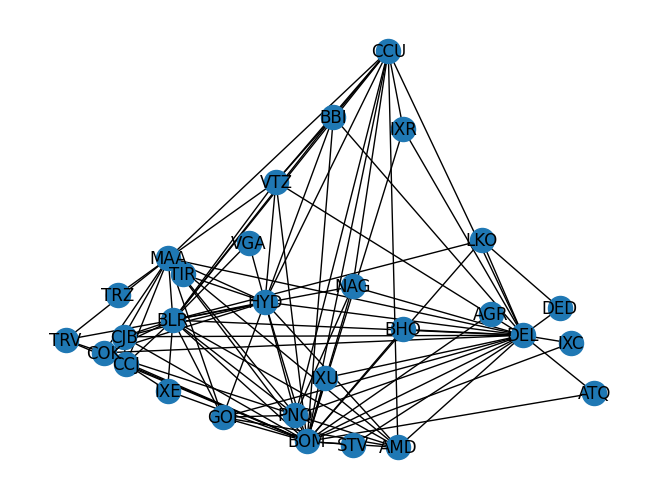

In [ ]:
nx.draw(graph, nx.get_node_attributes(graph, 'pos'), with_labels=True)


In [ ]:
betweenness = nx.betweenness_centrality(graph)
betweenness

{'AMD': 0.00037792894935752074,
 'BLR': 0.1122008062484253,
 'BOM': 0.3317775258251449,
 'CCU': 0.016490299823633155,
 'DEL': 0.22991307634164776,
 'GOI': 0.0,
 'HYD': 0.10809397833207356,
 'MAA': 0.09246661627614008,
 'PNQ': 0.005668934240362812,
 'BBI': 0.0,
 'VTZ': 0.0008818342151675485,
 'COK': 0.00637440161249685,
 'LKO': 0.007810531620055429,
 'NAG': 0.0,
 'TRV': 0.0,
 'CJB': 0.001965230536659108,
 'IXC': 0.0,
 'IXR': 0.0,
 'ATQ': 0.0,
 'BHO': 0.0,
 'IXE': 0.0,
 'CCJ': 0.003968253968253968,
 'IXU': 0.0,
 'DED': 0.0,
 'TRZ': 0.0,
 'AGR': 0.0,
 'STV': 0.0,
 'TIR': 0.0,
 'VGA': 0.0}

In [ ]:
closeness_centrality = nx.closeness_centrality(graph)
closeness_centrality

{'AMD': 0.5833333333333334,
 'BLR': 0.7368421052631579,
 'BOM': 0.875,
 'CCU': 0.6222222222222222,
 'DEL': 0.8,
 'GOI': 0.5714285714285714,
 'HYD': 0.6666666666666666,
 'MAA': 0.6666666666666666,
 'PNQ': 0.6086956521739131,
 'BBI': 0.5490196078431373,
 'VTZ': 0.5714285714285714,
 'COK': 0.5833333333333334,
 'LKO': 0.5185185185185185,
 'NAG': 0.5283018867924528,
 'TRV': 0.5185185185185185,
 'CJB': 0.56,
 'IXC': 0.49122807017543857,
 'IXR': 0.5,
 'ATQ': 0.49122807017543857,
 'BHO': 0.49122807017543857,
 'IXE': 0.5,
 'CCJ': 0.5384615384615384,
 'IXU': 0.49122807017543857,
 'DED': 0.45901639344262296,
 'TRZ': 0.4057971014492754,
 'AGR': 0.4745762711864407,
 'STV': 0.49122807017543857,
 'TIR': 0.4057971014492754,
 'VGA': 0.4444444444444444}

In [ ]:
degree_centrality = nx.degree_centrality(graph)
degree_centrality

{'AMD': 0.2857142857142857,
 'BLR': 0.6428571428571428,
 'BOM': 0.8571428571428571,
 'CCU': 0.39285714285714285,
 'DEL': 0.75,
 'GOI': 0.25,
 'HYD': 0.5,
 'MAA': 0.5,
 'PNQ': 0.3571428571428571,
 'BBI': 0.21428571428571427,
 'VTZ': 0.25,
 'COK': 0.2857142857142857,
 'LKO': 0.14285714285714285,
 'NAG': 0.17857142857142855,
 'TRV': 0.14285714285714285,
 'CJB': 0.21428571428571427,
 'IXC': 0.07142857142857142,
 'IXR': 0.10714285714285714,
 'ATQ': 0.07142857142857142,
 'BHO': 0.07142857142857142,
 'IXE': 0.10714285714285714,
 'CCJ': 0.21428571428571427,
 'IXU': 0.07142857142857142,
 'DED': 0.07142857142857142,
 'TRZ': 0.03571428571428571,
 'AGR': 0.03571428571428571,
 'STV': 0.07142857142857142,
 'TIR': 0.03571428571428571,
 'VGA': 0.07142857142857142}

In [ ]:
cc = nx.clustering(graph)
cc

{'AMD': 0.9642857142857143,
 'BLR': 0.40522875816993464,
 'BOM': 0.2463768115942029,
 'CCU': 0.6727272727272727,
 'DEL': 0.2857142857142857,
 'GOI': 1.0,
 'HYD': 0.5164835164835165,
 'MAA': 0.5274725274725275,
 'PNQ': 0.8,
 'BBI': 1.0,
 'VTZ': 0.9523809523809523,
 'COK': 0.75,
 'LKO': 0.6666666666666666,
 'NAG': 1.0,
 'TRV': 1.0,
 'CJB': 0.8666666666666667,
 'IXC': 1.0,
 'IXR': 1.0,
 'ATQ': 1.0,
 'BHO': 1.0,
 'IXE': 1.0,
 'CCJ': 0.7333333333333333,
 'IXU': 1.0,
 'DED': 1.0,
 'TRZ': 0,
 'AGR': 0,
 'STV': 1.0,
 'TIR': 0,
 'VGA': 1.0}

In [ ]:
clusters = nx.algorithms.community.greedy_modularity_communities(graph)
for i, cluster in enumerate(clusters):
    print(f"Cluster {i+1}: {list(cluster)}")


Cluster 1: ['BHO', 'BOM', 'IXU', 'AGR', 'DEL', 'LKO', 'IXC', 'ATQ', 'STV', 'DED']
Cluster 2: ['COK', 'CCJ', 'TRV', 'IXE', 'BLR', 'TRZ', 'CJB', 'MAA']
Cluster 3: ['VGA', 'VTZ', 'CCU', 'TIR', 'BBI', 'HYD', 'IXR']
Cluster 4: ['NAG', 'PNQ', 'GOI', 'AMD']


In [ ]:
from folium.plugins import HeatMap

In [ ]:
heatmap_layer = HeatMap(data=domestic_routes[['source_lat', 'source_lon']], radius=10)

In [ ]:
from google.colab import files
uploaded=files.upload()

Saving Passengerscsv.csv to Passengerscsv.csv


In [ ]:
import pandas as pdq
import matplotlib.pyplot as plt
data=pdq.read_csv('Passengerscsv.csv')

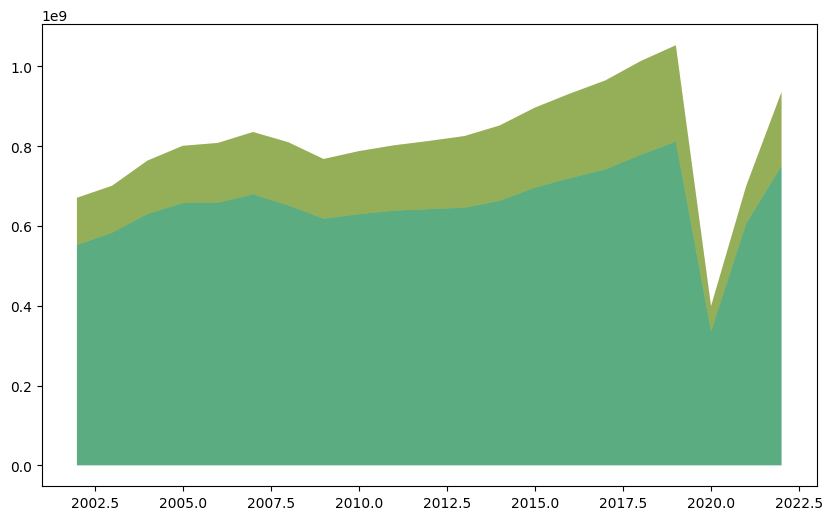

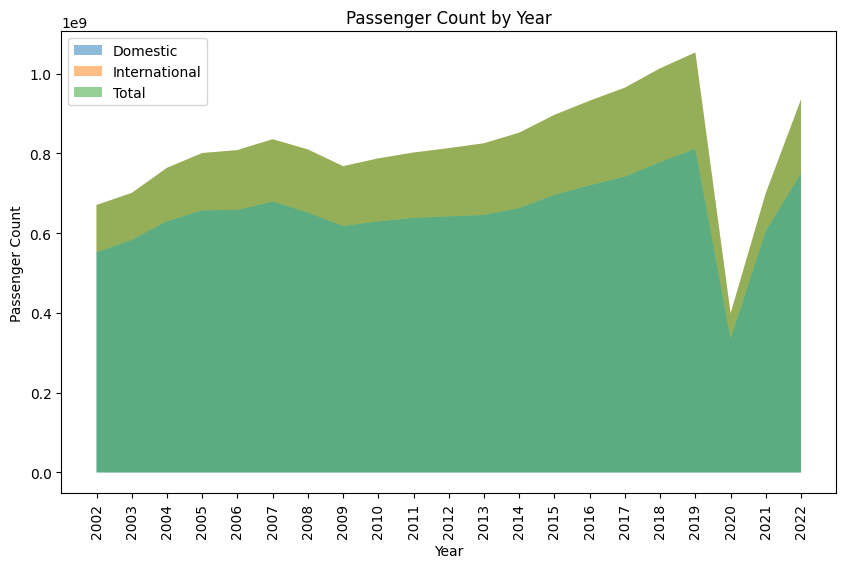

In [ ]:
fig, ax = plt.subplots(figsize=(10,6))
ax.fill_between(data['Year'], data['DOMESTIC'], alpha=0.5)
ax.fill_between(data['Year'], data['DOMESTIC'], data['TOTAL'], alpha=0.5)
ax.fill_between(data['Year'], data['TOTAL'], alpha=0.5)
fig, ax = plt.subplots(figsize=(10,6))
ax.fill_between(data['Year'], data['DOMESTIC'], alpha=0.5)
ax.fill_between(data['Year'], data['DOMESTIC'], data['TOTAL'], alpha=0.5)
ax.fill_between(data['Year'], data['TOTAL'], alpha=0.5)
ax.set_xlabel('Year')
ax.set_ylabel('Passenger Count')
ax.set_title('Passenger Count by Year')

plt.legend(['Domestic', 'International', 'Total'], loc='upper left')
plt.xticks(data['Year'], rotation=90)

plt.show()


In [ ]:
data.head()

,DOMESTIC,INTERNATIONAL,TOTAL
Year,,,
2002,551899643,118704850,670604493
2003,583293766,117569855,700863621
2004,629769616,133940075,763709691
2005,657261487,143588422,800849909
2006,658362620,149740591,808103211


In [ ]:
from google.colab import files
uploaded=files.upload()

Saving passengers2.csv to passengers2.csv


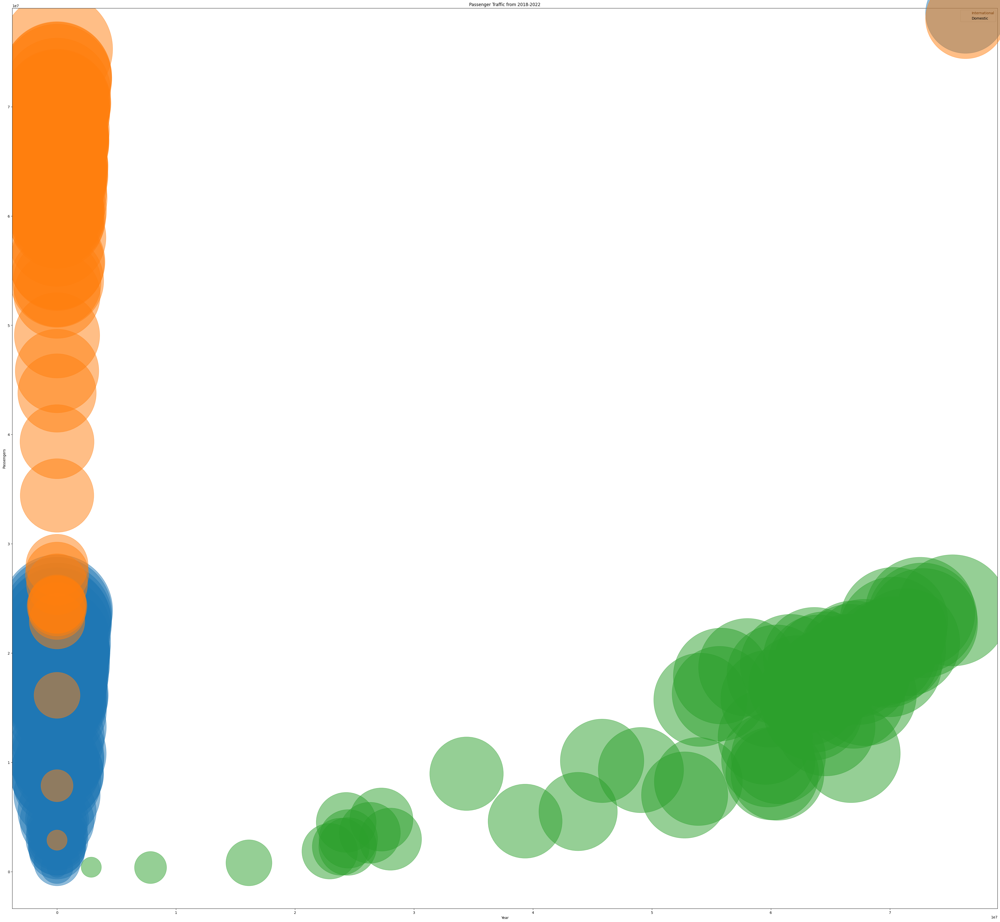

In [ ]:
import pandas as pde
import matplotlib.pyplot as plt
data = pde.read_csv('passengers2.csv')
plt.figure(figsize=(50,46))
plt.scatter(data['Year'], data['INTERNATIONAL'], s=data['TOTAL']/1000, alpha=0.5, label='International')
plt.scatter(data['Year'], data['DOMESTIC'], s=data['TOTAL']/1000, alpha=0.5, label='Domestic')
plt.scatter(df['DOMESTIC'], df['INTERNATIONAL'], s=df['TOTAL']/1000, alpha=0.5)
plt.xlabel('Year')
plt.ylabel('Passengers')
plt.title('Passenger Traffic from 2018-2022')
plt.legend()
plt.show()



In [ ]:
from google.colab import files
uploaded=files.upload()

Saving 1.06_INTERNATIONAL_OPERATIONS.csv to 1.06_INTERNATIONAL_OPERATIONS.csv


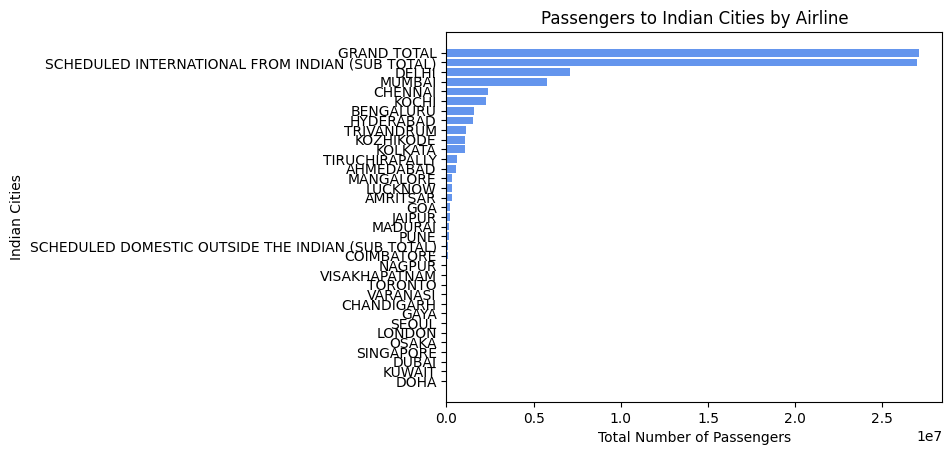

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
data = pd.read_csv('1.06_INTERNATIONAL_OPERATIONS.csv')
city_groups = data.groupby('CITY 2')['P2C2'].sum().sort_values()
plt.barh(city_groups.index, city_groups.values, color='cornflowerblue')
plt.xlabel('Total Number of Passengers')
plt.ylabel('Indian Cities')
plt.title('Passengers to Indian Cities by Airline')
plt.show()
